✅ Bibliotecas instaladas!
📌 OpenCV versão: 4.12.0
📤 UPLOAD DAS IMAGENS ESTÉREO

🔵 Faça upload da imagem ESQUERDA (left):
   Dica: Geralmente a imagem tirada primeiro ou da câmera esquerda



Saving left.png to left (1).png
✅ Imagem esquerda carregada: left (1).png

🔴 Faça upload da imagem DIREITA (right):
   Dica: Mesma cena, câmera deslocada para a direita



Saving right.png to right (1).png
✅ Imagem direita carregada: right (1).png

📊 Informações das imagens:
   Esquerda: (480, 640, 3) (H x W x C)
   Direita:  (480, 640, 3) (H x W x C)


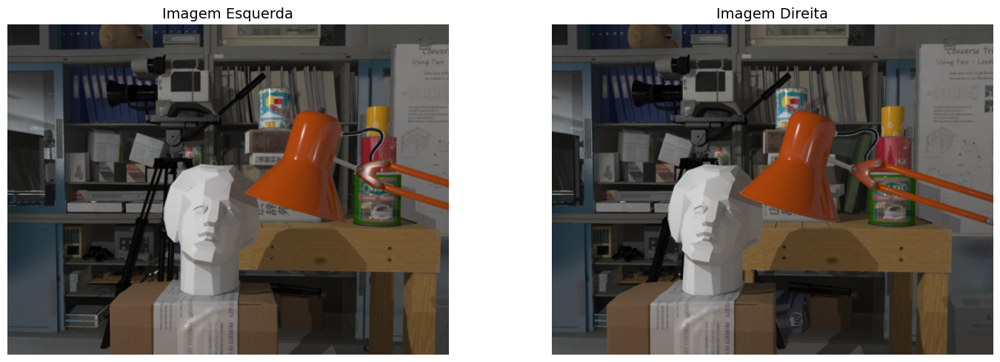


⚙️ CONFIGURAÇÃO DOS PARÂMETROS SGBM

📐 Parâmetros configurados:
   Window Size: 5
   Min Disparity: 0
   Num Disparities: 160

💡 Esses valores funcionam bem para a maioria dos casos.
   Se quiser ajustar depois, pode modificar essas variáveis!


🔧 Processando com SGBM (Semi-Global Block Matching)...
   🔄 Calculando disparidade...
   ✅ Disparidade calculada!
   📊 Shape: (480, 640)
   📊 Range: -1.0 a 157.2
   📊 Valores válidos: 207,635 pixels

📊 Visualizando mapa de disparidade...


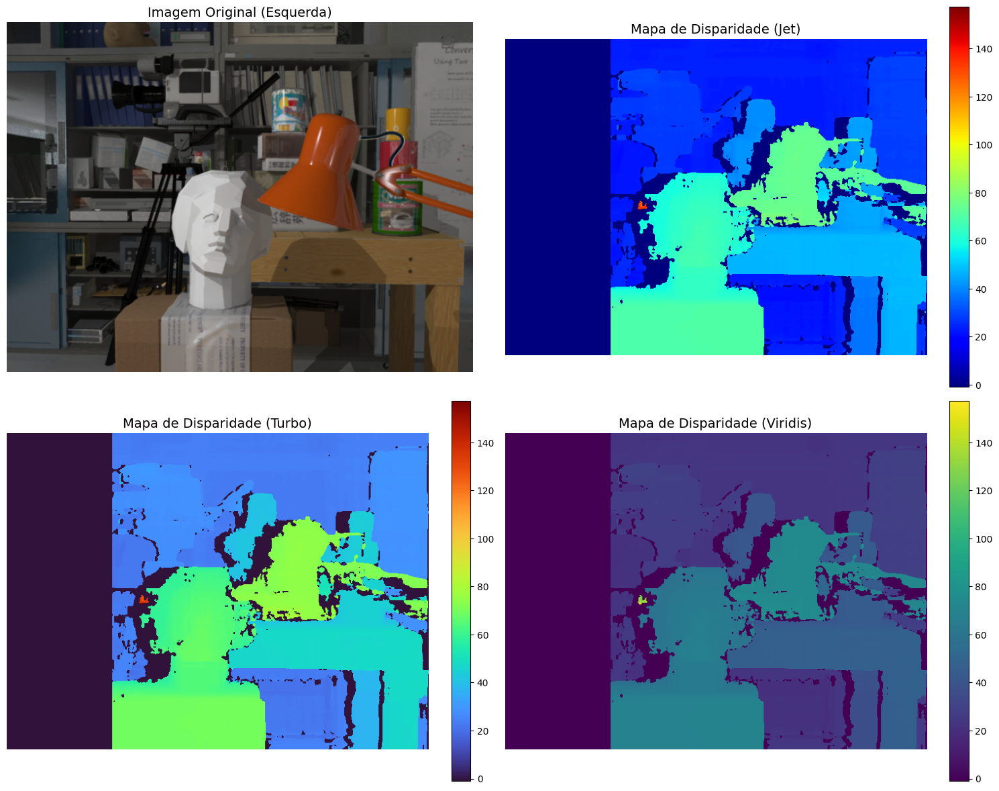

✅ Visualização concluída!

💡 Cores quentes (vermelho/amarelo) = objetos próximos
💡 Cores frias (azul/verde) = objetos distantes

📐 PARÂMETROS DE CALIBRAÇÃO
   Focal Length: 700 pixels
   Baseline: 0.1 metros (10.0 cm)

💡 Se as medidas 3D ficarem estranhas, ajuste esses valores!

☁️ Gerando point cloud 3D...
   📊 Pixels com disparidade válida: 207,635 de 307,200
   ✅ Point cloud gerado: 207,622 pontos
   📊 Range X: -0.76 a 1.33
   📊 Range Y: -1.07 a 1.08
   📊 Range Z: 0.45 a 4.61

🎨 Criando visualização interativa...
   📊 Subsampling de 207,622 para 100,000 pontos...
   ✅ Visualização criada!



💾 Salvando point cloud...
   🔄 Removendo outliers...
   📊 Pontos após limpeza: 204,817
   🔄 Estimando normais...
   ✅ Arquivo salvo: pointcloud_sgbm.ply

📥 DOWNLOAD DO POINT CLOUD

🎉 Processamento concluído com sucesso!
   Total de pontos: 204,817
   Arquivo: pointcloud_sgbm.ply

📥 Iniciando download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ TUDO PRONTO!

📖 Como abrir o arquivo .ply:
   1. CloudCompare (recomendado para análise)
   2. MeshLab (para edição)
   3. 3D Viewer (Windows)
   4. Blender (para renderização)
   5. https://3dviewer.net (online)

📊 ESTATÍSTICAS FINAIS

📸 Imagens processadas:
   Resolução: 640 x 480 pixels

📐 Disparidade:
   Range: -1.0 a 157.2
   Média: 41.9
   Cobertura: 67.6%

☁️ Point Cloud:
   Pontos totais: 204,817
   Cores: Sim
   Normais: Sim

📦 Bounding Box:
   X: -0.76 a 1.33 m
   Y: -1.07 a 1.08 m
   Z: 0.52 a 3.48 m

✨ PROCESSAMENTO COMPLETO!


In [2]:



"""
🔧 RECONSTRUÇÃO 3D COM SGBM (TRADICIONAL)
Sem Deep Learning - Apenas OpenCV
"""

# ========================================================================
# 📦 PARTE 1: INSTALAÇÃO E IMPORTS
# ========================================================================

!pip install -q opencv-python
!pip install -q open3d
!pip install -q plotly

import cv2
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from google.colab import files
from IPython.display import display, Image as IPImage
import io

print("✅ Bibliotecas instaladas!")
print(f"📌 OpenCV versão: {cv2.__version__}")

# ========================================================================
# 📤 PARTE 2: UPLOAD DAS SUAS IMAGENS
# ========================================================================

def upload_images():
    """Faz upload das imagens estéreo"""
    print("="*70)
    print("📤 UPLOAD DAS IMAGENS ESTÉREO")
    print("="*70)
    print("\n🔵 Faça upload da imagem ESQUERDA (left):")
    print("   Dica: Geralmente a imagem tirada primeiro ou da câmera esquerda\n")

    uploaded_left = files.upload()
    left_name = list(uploaded_left.keys())[0]
    print(f"✅ Imagem esquerda carregada: {left_name}\n")

    print("🔴 Faça upload da imagem DIREITA (right):")
    print("   Dica: Mesma cena, câmera deslocada para a direita\n")

    uploaded_right = files.upload()
    right_name = list(uploaded_right.keys())[0]
    print(f"✅ Imagem direita carregada: {right_name}\n")

    return left_name, right_name

# Fazer upload
left_filename, right_filename = upload_images()

# Carregar imagens
left_img = cv2.imread(left_filename)
right_img = cv2.imread(right_filename)

print("📊 Informações das imagens:")
print(f"   Esquerda: {left_img.shape} (H x W x C)")
print(f"   Direita:  {right_img.shape} (H x W x C)")

# Mostrar as imagens
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
axes[0].imshow(cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Imagem Esquerda', fontsize=14)
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB))
axes[1].set_title('Imagem Direita', fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()

# ========================================================================
# 🔧 PARTE 3: CONFIGURAR PARÂMETROS SGBM
# ========================================================================

print("\n" + "="*70)
print("⚙️ CONFIGURAÇÃO DOS PARÂMETROS SGBM")
print("="*70)

# Parâmetros do SGBM
WINDOW_SIZE = 5           # Tamanho da janela de comparação (5, 7, 9, 11)
MIN_DISPARITY = 0         # Disparidade mínima
NUM_DISPARITIES = 16 * 10 # Número de disparidades (múltiplo de 16)

print(f"\n📐 Parâmetros configurados:")
print(f"   Window Size: {WINDOW_SIZE}")
print(f"   Min Disparity: {MIN_DISPARITY}")
print(f"   Num Disparities: {NUM_DISPARITIES}")
print(f"\n💡 Esses valores funcionam bem para a maioria dos casos.")
print(f"   Se quiser ajustar depois, pode modificar essas variáveis!\n")

# ========================================================================
# 🎯 PARTE 4: ESTIMAR DISPARIDADE COM SGBM
# ========================================================================

def estimate_disparity_sgbm(left_img, right_img,
                           window_size=5,
                           min_disp=0,
                           num_disp=160):
    """
    Estima mapa de disparidade usando SGBM

    Args:
        left_img: Imagem esquerda (BGR)
        right_img: Imagem direita (BGR)
        window_size: Tamanho da janela (ímpar)
        min_disp: Disparidade mínima
        num_disp: Número de disparidades (múltiplo de 16)

    Returns:
        disparity: Mapa de disparidade normalizado
    """
    print("\n🔧 Processando com SGBM (Semi-Global Block Matching)...")

    # Converte para escala de cinza
    gray_left = cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY)
    gray_right = cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY)

    # Cria objeto SGBM
    stereo = cv2.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp,
        blockSize=window_size,
        P1=8 * 3 * window_size ** 2,      # Penalidade para mudanças pequenas
        P2=32 * 3 * window_size ** 2,     # Penalidade para mudanças grandes
        disp12MaxDiff=1,                   # Consistência left-right
        uniquenessRatio=10,                # Margem de unicidade
        speckleWindowSize=100,             # Tamanho de região para filtro
        speckleRange=32,                   # Variação máxima de disparidade
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY  # Modo de otimização
    )

    # Computa disparidade
    print("   🔄 Calculando disparidade...")
    disparity = stereo.compute(gray_left, gray_right).astype(np.float32) / 16.0

    print(f"   ✅ Disparidade calculada!")
    print(f"   📊 Shape: {disparity.shape}")
    print(f"   📊 Range: {disparity.min():.1f} a {disparity.max():.1f}")
    print(f"   📊 Valores válidos: {(disparity > 0).sum():,} pixels")

    return disparity

# Executar SGBM
disparity = estimate_disparity_sgbm(
    left_img,
    right_img,
    window_size=WINDOW_SIZE,
    min_disp=MIN_DISPARITY,
    num_disp=NUM_DISPARITIES
)

# ========================================================================
# 📊 PARTE 5: VISUALIZAR MAPA DE DISPARIDADE
# ========================================================================

print("\n📊 Visualizando mapa de disparidade...")

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Imagem original
axes[0, 0].imshow(cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Imagem Original (Esquerda)', fontsize=14)
axes[0, 0].axis('off')

# Disparidade - colormap 'jet'
im1 = axes[0, 1].imshow(disparity, cmap='jet')
axes[0, 1].set_title('Mapa de Disparidade (Jet)', fontsize=14)
axes[0, 1].axis('off')
plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)

# Disparidade - colormap 'turbo'
im2 = axes[1, 0].imshow(disparity, cmap='turbo')
axes[1, 0].set_title('Mapa de Disparidade (Turbo)', fontsize=14)
axes[1, 0].axis('off')
plt.colorbar(im2, ax=axes[1, 0], fraction=0.046)

# Disparidade - colormap 'viridis'
im3 = axes[1, 1].imshow(disparity, cmap='viridis')
axes[1, 1].set_title('Mapa de Disparidade (Viridis)', fontsize=14)
axes[1, 1].axis('off')
plt.colorbar(im3, ax=axes[1, 1], fraction=0.046)

plt.tight_layout()
plt.show()

print("✅ Visualização concluída!")
print("\n💡 Cores quentes (vermelho/amarelo) = objetos próximos")
print("💡 Cores frias (azul/verde) = objetos distantes")

# ========================================================================
# ☁️ PARTE 6: CONVERTER DISPARIDADE PARA POINT CLOUD
# ========================================================================

def disparity_to_point_cloud(disparity, left_img,
                             focal_length=700,
                             baseline=0.1):
    """
    Converte disparidade para point cloud 3D

    Args:
        disparity: Mapa de disparidade
        left_img: Imagem RGB para cores
        focal_length: Distância focal em pixels (ajuste conforme sua câmera)
        baseline: Distância entre câmeras em metros (ajuste conforme seu setup)

    Returns:
        points: Coordenadas 3D (N x 3)
        colors: Cores RGB (N x 3)
    """
    print("\n☁️ Gerando point cloud 3D...")

    h, w = disparity.shape

    # Cria grade de coordenadas de pixels
    u, v = np.meshgrid(np.arange(w), np.arange(h))

    # Máscara de disparidades válidas
    mask = disparity > 0

    print(f"   📊 Pixels com disparidade válida: {mask.sum():,} de {h*w:,}")

    # Converte disparidade para profundidade (Z)
    # Fórmula: Z = (focal_length * baseline) / disparity
    depth = np.zeros_like(disparity)
    depth[mask] = (focal_length * baseline) / (disparity[mask] + 1e-6)

    # Calcula coordenadas 3D
    # X = (u - cx) * Z / f
    # Y = (v - cy) * Z / f
    cx, cy = w / 2, h / 2

    X = (u - cx) * depth / focal_length
    Y = (v - cy) * depth / focal_length
    Z = depth

    # Filtra pontos válidos
    points = np.stack([X[mask], Y[mask], Z[mask]], axis=1)
    colors = left_img[mask] / 255.0  # Normaliza para [0, 1]

    # Remove outliers estatísticos (pontos muito distantes)
    mean_z = np.mean(Z[mask])
    std_z = np.std(Z[mask])
    valid = (Z[mask] < mean_z + 3*std_z) & (Z[mask] > 0.1)

    points = points[valid]
    colors = colors[valid]

    print(f"   ✅ Point cloud gerado: {len(points):,} pontos")
    print(f"   📊 Range X: {points[:, 0].min():.2f} a {points[:, 0].max():.2f}")
    print(f"   📊 Range Y: {points[:, 1].min():.2f} a {points[:, 1].max():.2f}")
    print(f"   📊 Range Z: {points[:, 2].min():.2f} a {points[:, 2].max():.2f}")

    return points, colors

# ⚙️ PARÂMETROS DE CALIBRAÇÃO (AJUSTE CONFORME SUA CÂMERA!)
FOCAL_LENGTH = 700    # Distância focal em pixels (valor típico)
BASELINE = 0.1        # Distância entre câmeras em metros (10cm)

print("\n" + "="*70)
print("📐 PARÂMETROS DE CALIBRAÇÃO")
print("="*70)
print(f"   Focal Length: {FOCAL_LENGTH} pixels")
print(f"   Baseline: {BASELINE} metros ({BASELINE*100:.1f} cm)")
print("\n💡 Se as medidas 3D ficarem estranhas, ajuste esses valores!")

# Gerar point cloud
points, colors = disparity_to_point_cloud(
    disparity,
    left_img,
    focal_length=FOCAL_LENGTH,
    baseline=BASELINE
)

# ========================================================================
# 🎨 PARTE 7: VISUALIZAÇÃO INTERATIVA 3D (PLOTLY)
# ========================================================================

def visualize_point_cloud_plotly(points, colors, title="Point Cloud 3D"):
    """Visualização interativa com Plotly"""

    print(f"\n🎨 Criando visualização interativa...")

    # Subsample se muitos pontos (para performance)
    max_points = 100000
    if len(points) > max_points:
        print(f"   📊 Subsampling de {len(points):,} para {max_points:,} pontos...")
        indices = np.random.choice(len(points), max_points, replace=False)
        points_vis = points[indices]
        colors_vis = colors[indices]
    else:
        points_vis = points
        colors_vis = colors

    # Converte cores para formato RGB string
    rgb_colors = [f'rgb({int(c[2]*255)},{int(c[1]*255)},{int(c[0]*255)})'
                  for c in colors_vis]

    fig = go.Figure(data=[go.Scatter3d(
        x=points_vis[:, 0],
        y=points_vis[:, 1],
        z=points_vis[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=rgb_colors,
            opacity=0.8
        ),
        text=[f'X: {p[0]:.2f}<br>Y: {p[1]:.2f}<br>Z: {p[2]:.2f}'
              for p in points_vis],
        hovertemplate='%{text}<extra></extra>'
    )])

    fig.update_layout(
        title=dict(
            text=title,
            font=dict(size=20)
        ),
        scene=dict(
            xaxis_title='X (metros)',
            yaxis_title='Y (metros)',
            zaxis_title='Z - Profundidade (metros)',
            aspectmode='data',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5)
            )
        ),
        width=1000,
        height=800,
        showlegend=False
    )

    print("   ✅ Visualização criada!")
    fig.show()

# Visualizar
visualize_point_cloud_plotly(
    points,
    colors,
    title="Reconstrução 3D - SGBM"
)

# ========================================================================
# 💾 PARTE 8: SALVAR POINT CLOUD
# ========================================================================

def save_point_cloud_ply(points, colors, filename="pointcloud_sgbm.ply"):
    """Salva point cloud em formato PLY"""

    print(f"\n💾 Salvando point cloud...")

    # Cria objeto Open3D
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    pcd.colors = o3d.utility.Vector3dVector(colors)

    # Remove outliers estatísticos
    print("   🔄 Removendo outliers...")
    pcd, ind = pcd.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
    print(f"   📊 Pontos após limpeza: {len(pcd.points):,}")

    # Estima normais (melhora visualização)
    print("   🔄 Estimando normais...")
    pcd.estimate_normals(
        search_param=o3d.geometry.KDTreeSearchParamHybrid(
            radius=0.1,
            max_nn=30
        )
    )

    # Salva arquivo
    o3d.io.write_point_cloud(filename, pcd)
    print(f"   ✅ Arquivo salvo: {filename}")

    return pcd

# Salvar
pcd = save_point_cloud_ply(points, colors, "pointcloud_sgbm.ply")

# ========================================================================
# 📥 PARTE 9: DOWNLOAD DO ARQUIVO
# ========================================================================

print("\n" + "="*70)
print("📥 DOWNLOAD DO POINT CLOUD")
print("="*70)

print("\n🎉 Processamento concluído com sucesso!")
print(f"   Total de pontos: {len(pcd.points):,}")
print(f"   Arquivo: pointcloud_sgbm.ply")

print("\n📥 Iniciando download...")
files.download("pointcloud_sgbm.ply")

print("\n✅ TUDO PRONTO!")
print("\n📖 Como abrir o arquivo .ply:")
print("   1. CloudCompare (recomendado para análise)")
print("   2. MeshLab (para edição)")
print("   3. 3D Viewer (Windows)")
print("   4. Blender (para renderização)")
print("   5. https://3dviewer.net (online)")

# ========================================================================
# 📊 PARTE 10: ESTATÍSTICAS FINAIS
# ========================================================================

print("\n" + "="*70)
print("📊 ESTATÍSTICAS FINAIS")
print("="*70)

print(f"\n📸 Imagens processadas:")
print(f"   Resolução: {left_img.shape[1]} x {left_img.shape[0]} pixels")

print(f"\n📐 Disparidade:")
print(f"   Range: {disparity.min():.1f} a {disparity.max():.1f}")
print(f"   Média: {disparity[disparity > 0].mean():.1f}")
print(f"   Cobertura: {(disparity > 0).sum() / disparity.size * 100:.1f}%")

print(f"\n☁️ Point Cloud:")
print(f"   Pontos totais: {len(pcd.points):,}")
print(f"   Cores: {'Sim' if pcd.has_colors() else 'Não'}")
print(f"   Normais: {'Sim' if pcd.has_normals() else 'Não'}")

bounds = pcd.get_axis_aligned_bounding_box()
print(f"\n📦 Bounding Box:")
print(f"   X: {bounds.get_min_bound()[0]:.2f} a {bounds.get_max_bound()[0]:.2f} m")
print(f"   Y: {bounds.get_min_bound()[1]:.2f} a {bounds.get_max_bound()[1]:.2f} m")
print(f"   Z: {bounds.get_min_bound()[2]:.2f} a {bounds.get_max_bound()[2]:.2f} m")

print("\n" + "="*70)
print("✨ PROCESSAMENTO COMPLETO!")
print("="*70)




